## Decision Tree

### 1. Fit the data in the decision tree

In [1]:
# Import
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.datasets import load_breast_cancer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

In [4]:
# Load the dataset
from sklearn.datasets import load_iris
data = load_iris()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

In [5]:
# Train Test split
X_train, X_test, Y_train, Y_test = train_test_split(df[data.feature_names], df['target'], random_state=0)

In [6]:
# Modeling
clf = DecisionTreeClassifier(max_depth = 2, random_state = 0)
clf.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=2, random_state=0)

### 2. Visualize using Matplotlib

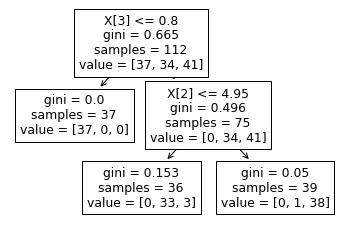

In [9]:
from sklearn import tree
tree.plot_tree(clf);

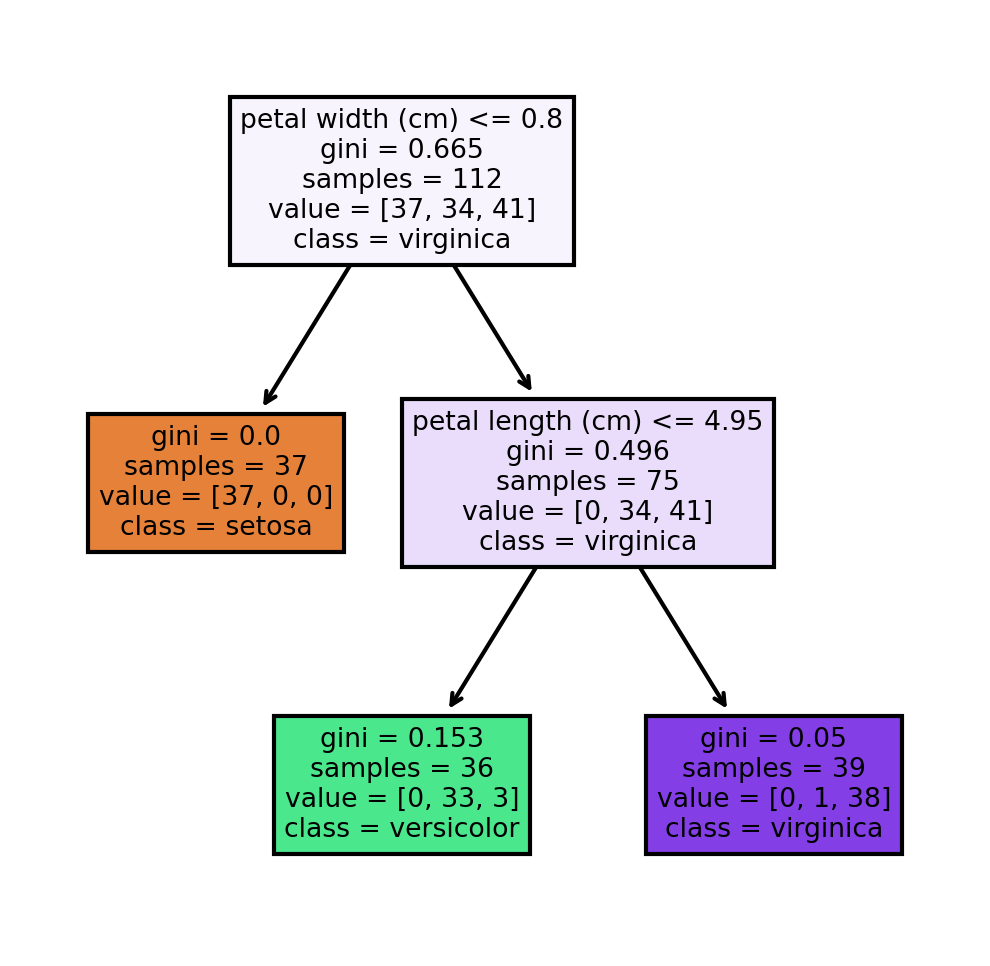

In [10]:
# Add some features and save the figure
fn=['sepal length (cm)','sepal width (cm)','petal length (cm)','petal width (cm)']
cn=['setosa', 'versicolor', 'virginica']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(clf,
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('imagename.png')

### 3. Visuallize Decision Trees using Graphviz

#### 3.1 Export the model to a dot file 

In [11]:
tree.export_graphviz(clf,
                     out_file="tree.dot",
                     feature_names = fn, 
                     class_names=cn,
                     filled = True)

#### 3.2 Install and using Graphviz


(1) conda install python-graphviz

(2) dot -Tpng tree.dot -o tree.png

#### 3.3 Within Scikit-Learn

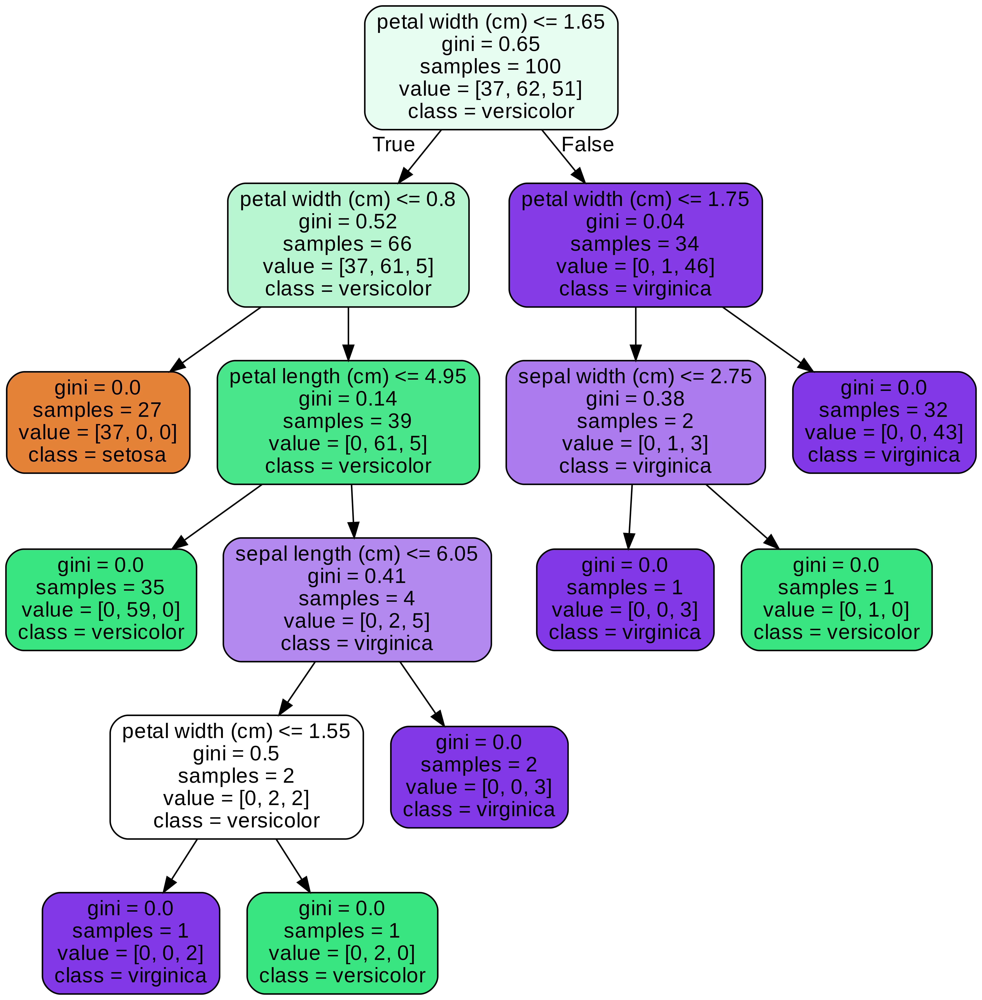

In [44]:
from sklearn.datasets import load_iris
iris = load_iris()

# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)

# Train
model.fit(iris.data, iris.target)
# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = iris.feature_names,
                class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## Random Forest

### 1. Fit the Random Forest Model

In [12]:
# Load the Breast Cancer (Diagnostic) Dataset
data = load_breast_cancer()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target
# Arrange Data into Features Matrix and Target Vector
X = df.loc[:, df.columns != 'target']
y = df.loc[:, 'target'].values
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, y, random_state=0)
# Random Forests in `scikit-learn` (with N = 100)
rf = RandomForestClassifier(n_estimators=100,
                            random_state=0)
rf.fit(X_train, Y_train)

RandomForestClassifier(random_state=0)

In [13]:
# Visualize estimators

In [20]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=209652396)

### 2. Visualize random selected estimastor (Decision Tree)

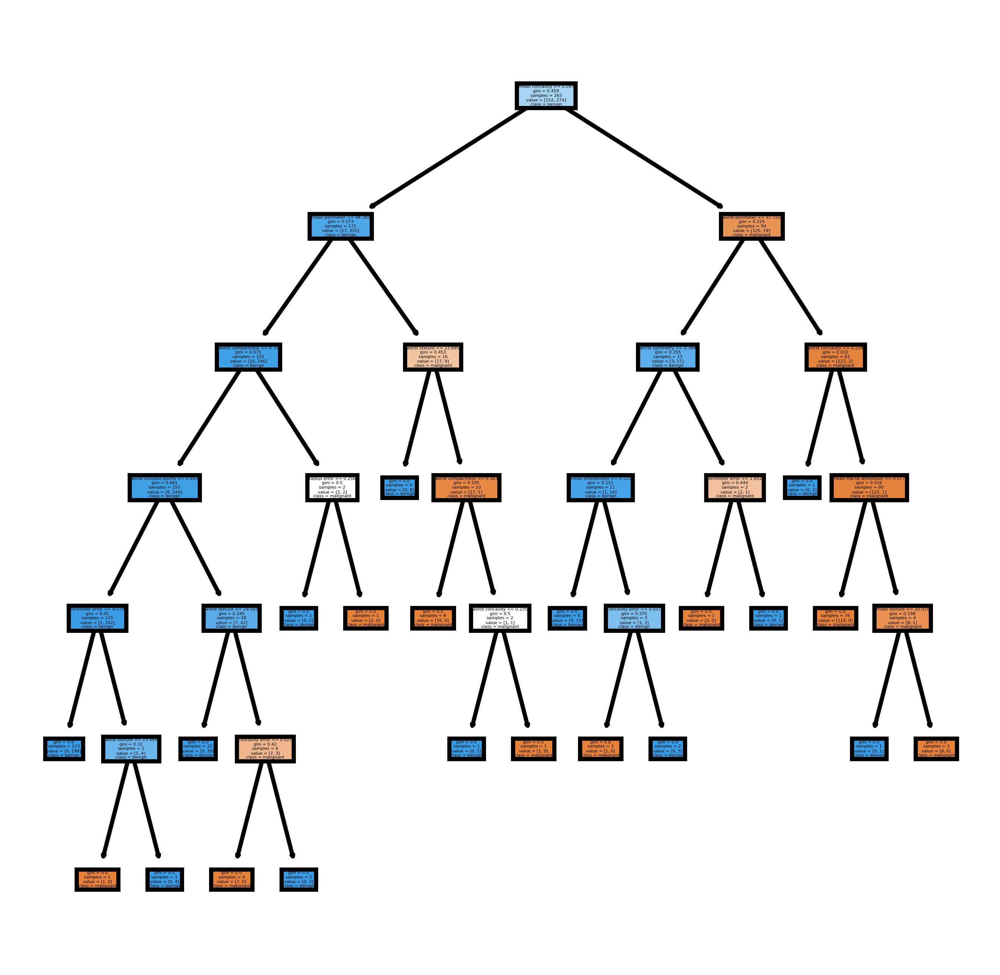

In [21]:
fn=data.feature_names
cn=data.target_names
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

In [22]:
# Visualize multiple estimators
fn=data.feature_names
cn=data.target_names
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(rf.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

---

## Visualize using `dtreeviz`

In [23]:
import sys

if 'google.colab' in sys.modules:
  !pip install -q dtreeviz

     |████████████████████████████████| 62 kB 1.2 MB/s 


In [24]:
import sys
import os
# add library module to PYTHONPATH
sys.path.append(f"{os.getcwd()}/../")


In [25]:
from sklearn.datasets import *
from dtreeviz.trees import *
from IPython.display import Image, display_svg, SVG

### 1. Regression Tree Visualization

In [29]:
regr = tree.DecisionTreeRegressor(max_depth=3)
boston = load_boston();

X_train = boston.data
y_train = boston.target
regr.fit(X_train, y_train);

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (i.e.

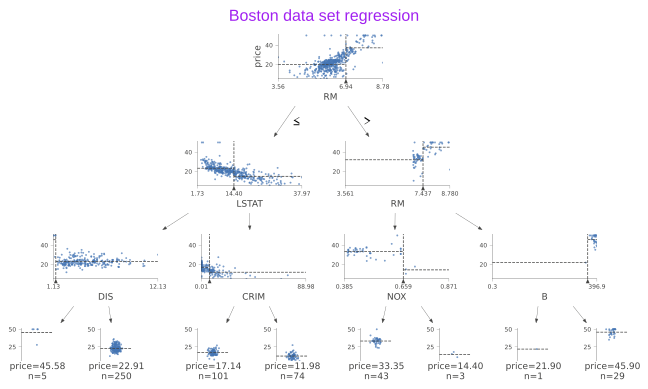

In [30]:
viz = dtreeviz(regr,
               X_train,
               y_train,
               target_name='price',  # this name will be displayed at the leaf node
               feature_names=boston.feature_names,
               title="Boston data set regression",
               fontname="Arial",
               title_fontsize=16,
               colors = {"title":"purple"}
              )
viz
# viz.view() will give give a popup with graph in pdf

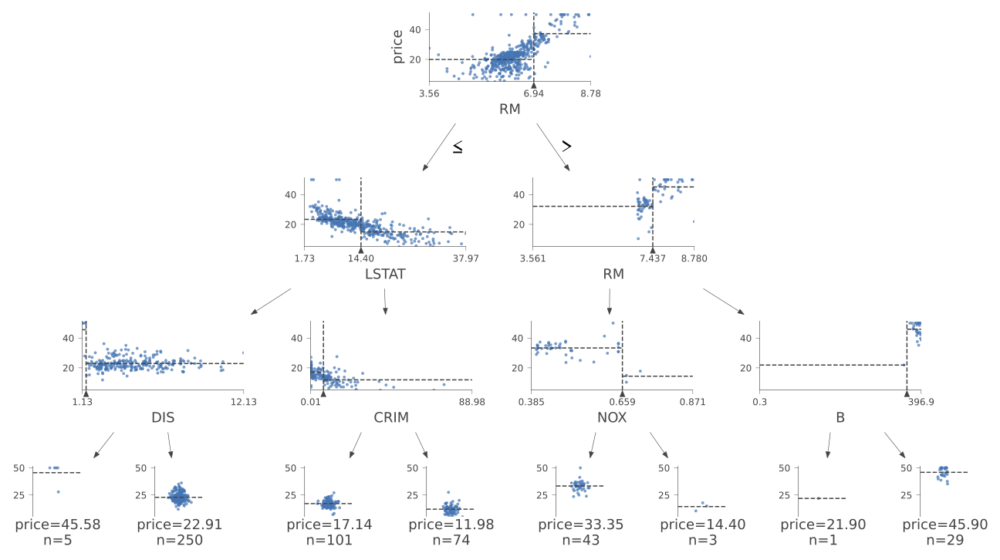

In [32]:
# Scale the overall image
dtreeviz(regr,
       X_train,
       y_train,
       target_name='price',  # this name will be displayed at the leaf node
       feature_names=boston.feature_names,
       scale=2
      )

### 2. Classification Tree Visualization

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


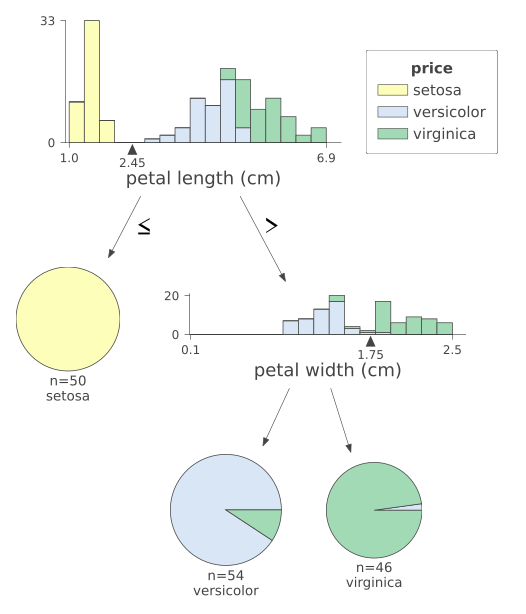

In [34]:
clas = tree.DecisionTreeClassifier(max_depth=2)  
iris = load_iris()

X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train)

viz = dtreeviz(clas, 
               X_train,
               y_train,
               target_name='price',
               feature_names=iris.feature_names, 
               scale=2,
               class_names=["setosa", "versicolor", "virginica"], 
               histtype= 'barstacked')  # barstackes is default
viz

### 3. Classification tree with left to right alignment

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


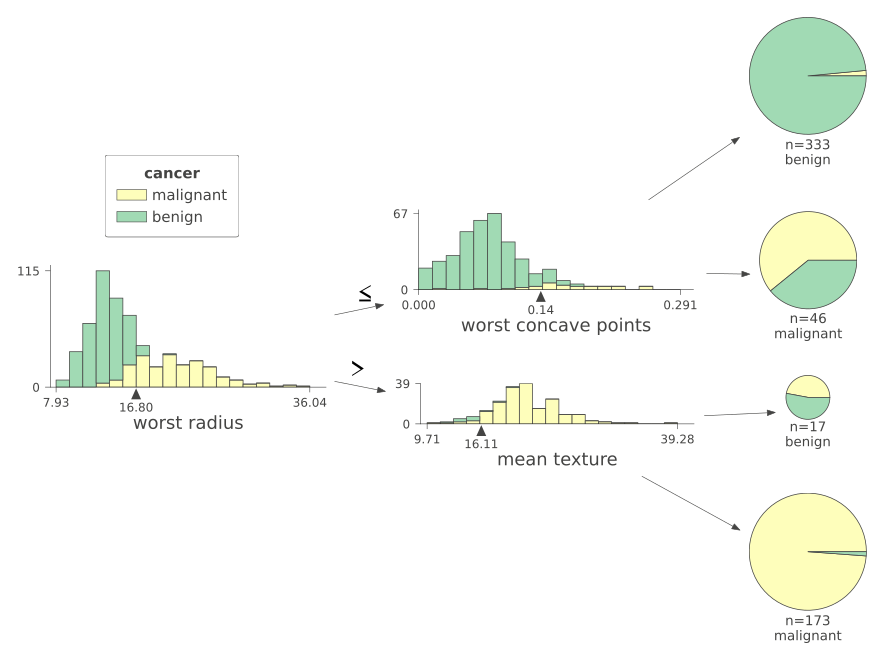

In [36]:
clas = tree.DecisionTreeClassifier(max_depth=2)  
cancer = load_breast_cancer()

X_train = cancer.data
y_train = cancer.target
clas.fit(X_train, y_train)

viz = dtreeviz(clas, 
               X_train,
               y_train,
               target_name='cancer',
               feature_names=cancer.feature_names, 
               class_names=["malignant", "benign"],
               scale=2,
               orientation='LR')
viz

### 4. Classification on multiple classes

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


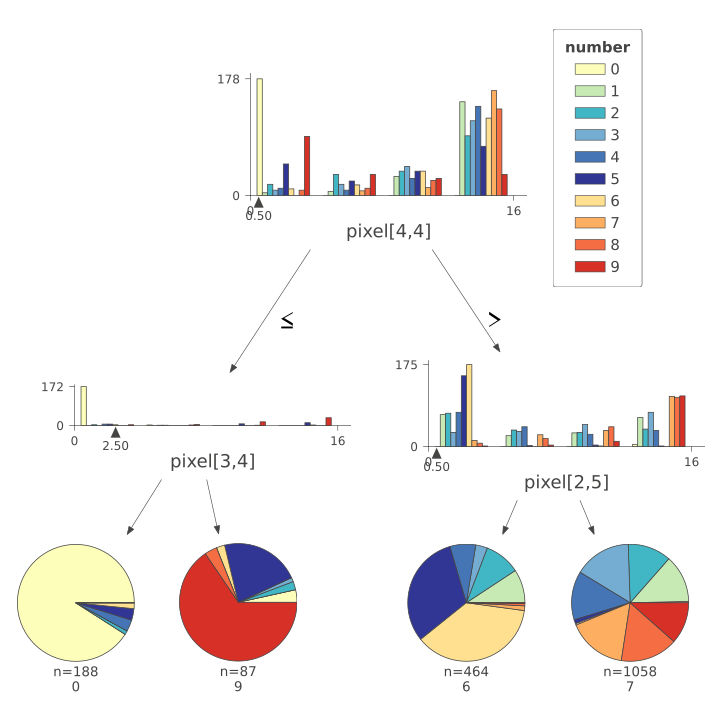

In [38]:
clas = tree.DecisionTreeClassifier(max_depth=2)  
digits = load_digits()

X_train = digits.data
y_train = digits.target
clas.fit(X_train, y_train)

# "8x8 image of integer pixels in the range 0..16."
columns = [f'pixel[{i},{j}]' for i in range(8) for j in range(8)]


viz = dtreeviz(clas, 
               X_train,
               y_train,
               target_name='number',
               feature_names=columns, 
               class_names=[chr(c) for c in range(ord('0'),ord('9')+1)],
               histtype='bar', 
               scale=2,
               orientation ='TD')
viz

### 5. Prediction path of a single observation

It is important to understand which decision path is followed by a specific test observation. The prediction path is usually used for interpretetion of a prediction to understand why the tree made xyz prediction for the observation abc.

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


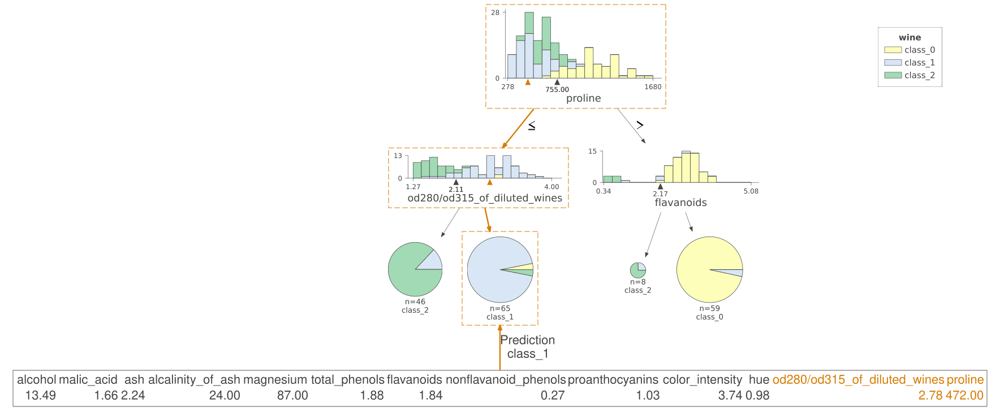

In [39]:
clf = tree.DecisionTreeClassifier(max_depth=2)  
wine = load_wine()

X_train = wine.data
y_train = wine.target
clf.fit(X_train, y_train)

# pick random X observation for demo
X = wine.data[np.random.randint(0, len(wine.data)),:]

viz = dtreeviz(clf,
               wine.data,
               wine.target,
               target_name='wine',
               feature_names=wine.feature_names,
               class_names=list(wine.target_names),
               scale=2,
               X=X)  # pass the test observation
viz

### 6. Show node numbers

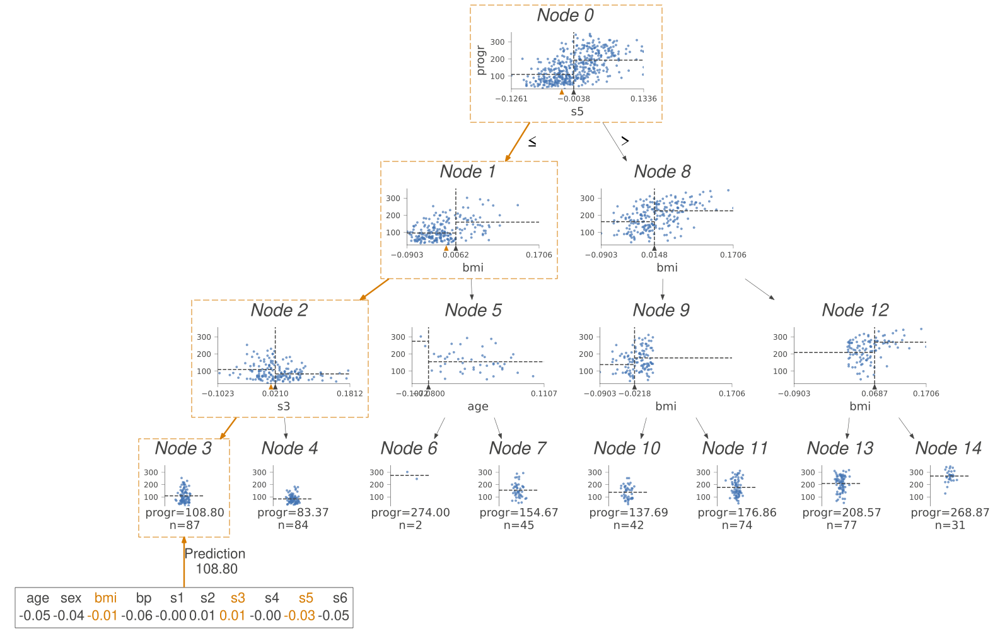

In [40]:
regr = tree.DecisionTreeRegressor(max_depth=3)
diabetes = load_diabetes()

X_train = diabetes.data
y_train = diabetes.target
regr.fit(X_train, y_train)

X = diabetes.data[np.random.randint(0, len(diabetes.data)),:]

viz = dtreeviz(regr,
               X_train,
               y_train,
               target_name='progr',  # this name will be displayed at the leaf node
               feature_names=diabetes.feature_names,
               X=X, 
               show_node_labels = True,
               scale=2
              )
viz

### 7. Simple graph

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


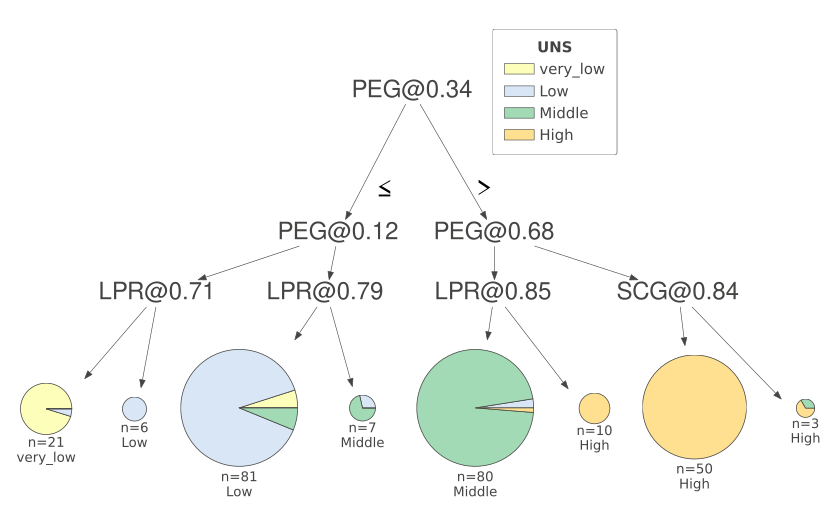

In [43]:
clf = tree.DecisionTreeClassifier(max_depth=3)

if 'google.colab' in sys.modules:
  know = pd.read_csv("https://raw.githubusercontent.com/parrt/dtreeviz/master/testing/data/knowledge.csv")
else:
  know = pd.read_csv("../testing/data/knowledge.csv")
target_names = ['very_low', 'Low', 'Middle', 'High']
know['UNS'] = know['UNS'].map({n: i for i, n in enumerate(target_names)})

X_train, y_train = know.drop('UNS', axis=1), know['UNS']
clf = clf.fit(X_train, y_train)

viz = dtreeviz(clf, 
               X_train,
               y_train,
               target_name='UNS',
               feature_names=X_train.columns.values,
               class_names=target_names,
               scale=2,
               fancy=False)
viz

## Reference:
1. https://www.codementor.io/@mgalarny/visualizing-decision-trees-with-python-scikit-learn-graphviz-matplotlib-154mszcto7
2. https://github.com/parrt/dtreeviz
3. https://colab.research.google.com/github/parrt/dtreeviz/blob/master/notebooks/examples.ipynb#scrollTo=NqqGv5eL6bN3
4. https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c